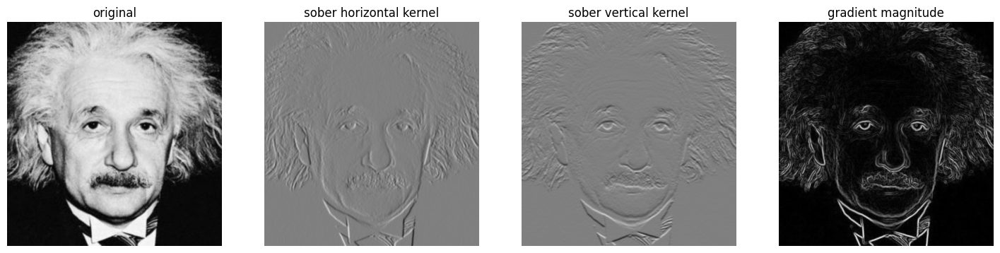

In [41]:
#q7
#sober horizontal kernel
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

im = cv.imread("images/einstein.png", cv.IMREAD_GRAYSCALE).astype(np.float32)
s_h = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype='float32')
s_v = np.array( [[-1,-2,-1],[0,0,0],[1,2,1]], dtype='float32')
f_h= cv.filter2D(im,-1, s_h)
f_v = cv.filter2D(im, -1,s_v )
grad_mag = np.sqrt(f_v**2+f_h**2)

f, a =plt.subplots(1,4,  figsize=(18,18))
a[0].imshow(im, cmap='gray',vmin=0,vmax=255)
a[0].set_title("original")
a[0].axis('off')

a[1].imshow(f_h, cmap= "gray",vmin=-1020,vmax=1020)
a[1].set_title("sober horizontal kernel")
a[1].axis('off')

a[2].imshow(f_v, cmap= 'gray',vmin=-1020,vmax=1020)
a[2].set_title("sober vertical kernel")
a[2].axis('off')

a[3].imshow(grad_mag, cmap= 'gray')
a[3].set_title("gradient magnitude")
a[3].axis('off')
plt.show()

#part b



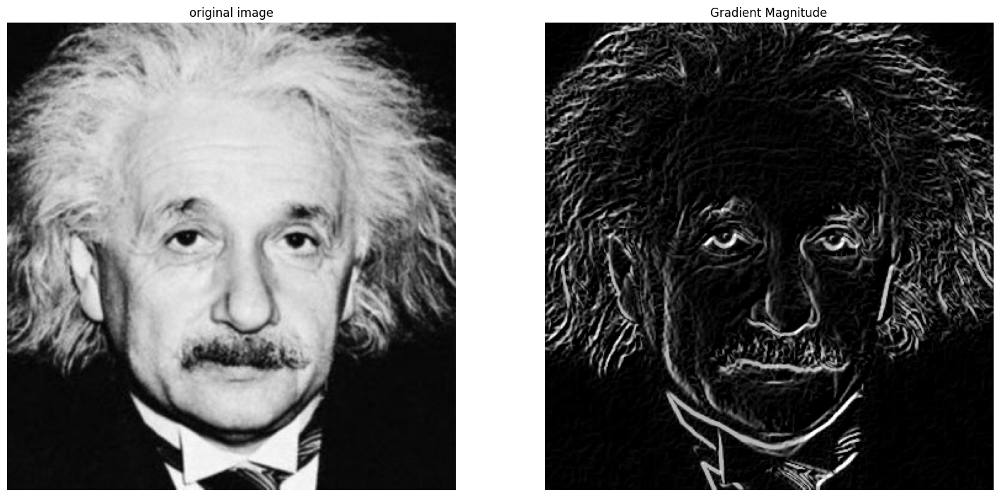

In [42]:
#q7
#sober horizontal kernel
%matplotlib inline
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

imc = cv.imread("images/einstein.png", cv.IMREAD_GRAYSCALE).astype(np.float32)
im=imc.copy()
im2 = imc.copy()
s_h = np.array([(-1,0,1),(-2,0,2),(-1,0,1)], dtype='float32')
s_v = np.array( [(-1,-2,-1),(0,0,0),(1,2,1)], dtype='float32')
def filtering(im,s):
    rk, ck =s.shape
    conv =np.zeros_like(im)
    r, c =im.shape
    for i in range(1,r-int((rk-1)/2)):
        for j in range(1,c-int((ck-1)/2)):
            k=0
            for m in range(-1,2):
                for n in range(-1,2):
                    k += im[i+m,j+n]*s[1+m,1+n]
            if (k > 255.0):
                conv[i,j]=255.0
            elif (k<0.0):
                conv[i,j]=0.0
            else:
                conv[i,j]=k
    return conv

def filtering_pad(img,s):  #filtering with padding
    pad = s.shape[1] //2
    im = cv.copyMakeBorder(img,pad,pad,pad,pad,cv.BORDER_REPLICATE)
    rk, ck =s.shape
    conv =np.zeros_like(im)
    r, c =im.shape
    for i in range(1,r-pad):
        for j in range(1,c-pad):
            k=0
            for m in range(-1,2):
                for n in range(-1,2):
                    k += im[i+m,j+n]*s[1+m,1+n]
            if (k > 255.0):
                conv[i,j]=255.0
            elif (k<0.0):
                conv[i,j]=0.0
            else:
                conv[i,j]=k
    conv2 = conv[1:im.shape[0]-1, 1:im.shape[1]-1]
    assert (img.size == conv2.size)
    return conv2
def gradient_magnitude(im,f1=s_h,f2=s_v):
    f_h=filtering_pad(im,s_h)
    f_v=filtering_pad(im,s_v)
    gd = np.sqrt((f_h**2+f_v**2)/(1020/255))
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            gd[i,j] = gd[i,j]/1020*255
    return gd
gd1 = gradient_magnitude(im)
f, a =plt.subplots(1,2,  figsize=(18,18))
a[0].imshow(im, cmap='gray',vmin=0,vmax=255)
a[0].set_title("original image")
a[0].axis('off')

a[1].imshow(gd1, cmap= "gray")
a[1].set_title("Gradient Magnitude")
a[1].axis('off')

# f_h=filtering(im,s_h)
# f_v=filtering(im,s_v)

# f_h1=filtering_pad(im,s_h)
# f_v1=filtering_pad(im,s_v)
# gd2 = np.sqrt(f_h1**2+f_v1**2)
# a[0,0].imshow(im, cmap='gray',vmin=0,vmax=255)
# a[0,0].set_title("original")
# a[0,0].axis('off')

# a[0,1].imshow(f_h, cmap= "gray",vmin=-500,vmax=500)
# a[0,1].set_title("sober_h kernel using function")
# a[0,1].axis('off')

# a[0,2].imshow(f_v, cmap= 'gray',vmin=-500,vmax=500)
# a[0,2].set_title("sober_v kernel using function ")
# a[0,2].axis('off')

# a[0,3].imshow(gd1, cmap= 'gray')
# a[0,3].set_title("gradient magnitude ")
# a[0,3].axis('off')

# a[1,0].imshow(im, cmap='gray',vmin=0,vmax=255)
# a[1,0].set_title("original")
# a[1,0].axis('off')

# a[1,1].imshow(f_h1, cmap= "gray",vmin=0,vmax=255)
# a[1,1].set_title("sober_h kernel using function with padding")
# a[1,1].axis('off')

# a[1,2].imshow(f_v1, cmap= 'gray',vmin=0,vmax=255)
# a[1,2].set_title("sober_v kernel using function with padding ")
# a[1,2].axis('off')

# a[1,3].imshow(gd2, cmap= 'gray')
# a[1,3].set_title("gradient magnitude")
# a[1,3].axis('off')

plt.show()

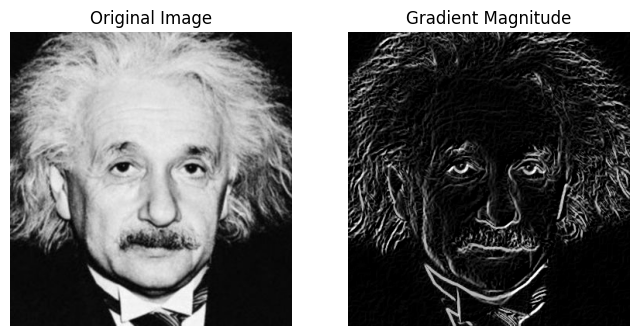

In [43]:
# using the property of filter

sob_h = np.multiply((np.array([[1],[2],[1]], dtype=np.int32)),(np.array([1,0,-1], dtype=np.int32)))
sob_v = sob_h.T

gd = gradient_magnitude(imc,sob_h,sob_v)
f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow( im, cmap='gray',vmin=0,vmax=255)
a[0].set_title('Original Image')
a[0].axis('off')

a[1].imshow( gd, cmap='gray')
a[1].set_title('Gradient Magnitude')
a[1].axis('off')
plt.show()



[[7. 7. 8.]
 [7. 7. 8.]
 [7. 7. 8.]]
[[7. 8. 8.]
 [7. 8. 8.]
 [7. 8. 8.]]
[[7. 8. 8.]
 [8. 8. 8.]
 [8. 8. 8.]]
[[8. 8. 8.]
 [8. 8. 7.]
 [8. 8. 8.]]
[[8. 7. 8.]
 [8. 7. 7.]
 [8. 8. 8.]]
[[7. 7. 8.]
 [7. 7. 8.]
 [8. 8. 8.]]
[[7. 8. 8.]
 [7. 8. 8.]
 [8. 8. 8.]]
[[8. 8. 8.]
 [8. 8. 8.]
 [8. 8. 8.]]
[[8. 8. 8.]
 [8. 8. 8.]
 [8. 8. 8.]]
[[8. 8. 8.]
 [8. 8. 9.]
 [8. 8. 8.]]
[[8. 9. 8.]
 [8. 9. 9.]
 [8. 8. 8.]]
[[9. 9. 7.]
 [9. 9. 9.]
 [8. 8. 7.]]
[[9. 9. 7.]
 [9. 9. 8.]
 [8. 7. 7.]]
[[9. 8. 7.]
 [9. 8. 8.]
 [7. 7. 7.]]
[[8. 8. 7.]
 [8. 8. 7.]
 [7. 7. 7.]]
[[8. 7. 7.]
 [8. 7. 7.]
 [7. 7. 7.]]
[[7. 7. 8.]
 [7. 7. 8.]
 [7. 7. 8.]]
[[7. 8. 9.]
 [7. 8. 8.]
 [7. 8. 9.]]
[[ 8.  8. 10.]
 [ 8.  8.  9.]
 [ 8.  9. 10.]]
[[ 8.  9.  8.]
 [ 8.  9.  9.]
 [ 9. 10.  8.]]
[[ 9.  9.  9.]
 [ 9.  9.  9.]
 [10.  8.  9.]]
[[9. 9. 9.]
 [9. 9. 9.]
 [8. 9. 9.]]
[[ 9.  9. 10.]
 [ 9.  9.  9.]
 [ 9.  9. 10.]]
[[ 9.  9. 10.]
 [ 9.  9.  9.]
 [ 9. 10. 10.]]
[[ 9.  9. 10.]
 [ 9.  9.  9.]
 [10. 10. 10.]]
[[ 9.  9. 10.]
 [ 9. 

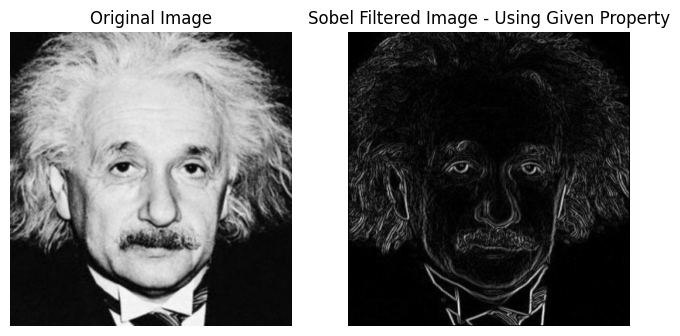

In [31]:
im_gd = np.zeros((im.shape[0],im.shape[1]),np.uint8)
im = cv.imread('images/einstein.png', cv.IMREAD_GRAYSCALE).astype(np.uint8)
mat = np.multiply((np.array([[1],[2],[1]], dtype=np.int32)),(np.array([1,0,-1], dtype=np.int32)))

sobel_hh = mat#np.array([[0,0,0],[0,0,0],[0,0,0]])
# for i in range(len(mat)):
#     sobel_hh[i] = mat[i][::-1]

sobel_vv = sobel_hh.T

for i in range(1,im.shape[0]-1):
    for j in range(1,im.shape[1]-1):
        image = np.array([[im[i-1,j-1],im[i,j],im[i+1,j+1]], [im[i,j-1],im[i,j],im[i,j+1]], [im[i+1,j-1],im[i+1,j],im[i+1,j+1]]], dtype=np.float32)
        val_xx = 0
        val_yy = 0
        for k in range(3):
            for m in range(3):
                val_xx += image[k][m]*sobel_hh[k][m]
                val_yy += image[k][m]*sobel_vv[k][m]
        ##print(val_xx, val_yy)
        grad = np.sqrt(val_xx**2 + val_yy**2)
        im_gd[i, j] = (grad / 1020) * 255
                
fig, ax = plt.subplots(1, 2, figsize=(8, 8))
ax[0].imshow(im, cmap = 'gray', vmin = 0, vmax = 255)
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(im_gd, cmap = 'gray')
ax[1].set_title("Sobel Filtered Image - Using Given Property")
ax[1].axis('off')

plt.show()    